In [2]:
import pandas as pd
pd.set_option('display.max_colwidth', -1)
pd.set_option('display.max_columns', 500)
import plotto

import imp
import pp
imp.reload(pp)
%matplotlib inline
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import plotto

ureg = plotto.ureg 
DB="/tmp/antonio/magneticum.sql.1e4.all_boxes"
simul = plotto.query(DB)
pd.set_option('display.max_colwidth', -1)


In [3]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) { return false; }

<IPython.core.display.Javascript object>

In [9]:
all_df = simul ("""
    
    select  simulation.*, snap.*, fof.mcri, fof.tgas0, pp.* ,snap.a, fof.r5cc, fof.rvir, fof.m5cc, fof.glen, fof.rcri, fof.id_cluster as fof_id_cluster, pp.id_cluster as pp_id_cluster
    from pp
    inner join fof on fof.snap_id=pp.snap_id and fof.id_cluster = pp.id_cluster
    inner join snap on  pp.snap_id = snap.id
    inner join simulation on simulation.id = snap.simulation_id
    and instr( simulation.name,'_dm')<=0
    -- and instr( simulation.name,'Box4')<=0
     
   -- and snap.tag='z0'
    --and snap.id= 5
    """)
#return
qz="""
    select  fof.mcri, fof.tgas0, pp.* , snap.a,fof.r5cc, fof.rvir, fof.m5cc, fof.glen, fof.rcri, fof.id_cluster as fof_id_cluster, pp.id_cluster as pp_id_cluster
    from pp
    inner join fof on fof.snap_id=pp.snap_id and fof.id_cluster = pp.id_cluster
    inner join snap on  pp.snap_id = snap.id
    inner join simulation on simulation.id = snap.simulation_id
    and instr( simulation.name,'_dm')<=0
     
    and snap.tag='%s'
    --and snap.id= 5
    """

qzb="""
    select  fof.gpos0, fof.gpos1, fof.gpos2,fof.mcri, fof.tgas0, pp.* , snap.a,fof.r5cc, fof.rvir, fof.m5cc, fof.glen, fof.rcri, fof.id_cluster as fof_id_cluster, pp.id_cluster as pp_id_cluster
    from pp
    inner join fof on fof.snap_id=pp.snap_id and fof.id_cluster = pp.id_cluster
    inner join snap on  pp.snap_id = snap.id
    inner join simulation on simulation.id = snap.simulation_id
    and instr( simulation.name,'_dm')<=0
      and instr( simulation.name,'%s')>0
    and snap.tag='%s'
    --and snap.id= 5
    """

#box2_df_z0 = simul  (qzb%('Box2','z0'))


In [5]:
simul("select *,snap.id as snap_id from snap inner join simulation on simulation.id = snap.simulation_id")

,id,name,redshift,a,simulation_id,tag,id,name,box_size,h,snap_id
0,1,037,2.220446e-16,1.000000,1,z0,1,/HydroSims/Magneticum/Box0/mr_bao/,2688000.0,0.704,1
1,2,031,2.520891e-01,0.798665,2,z0,2,/HydroSims/Magneticum/Box2b/hr_bao/,640000.0,0.704,2
2,3,136,6.634019e-02,0.937787,3,z0,3,/HydroSims/Magneticum/Box4/uhr_test/,48000.0,0.704,3
3,4,025,4.701941e-01,0.680182,1,z05,1,/HydroSims/Magneticum/Box0/mr_bao/,2688000.0,0.704,4
4,5,014,1.178895e+00,0.458948,1,z1,1,/HydroSims/Magneticum/Box0/mr_bao/,2688000.0,0.704,5
5,6,012,1.477581e+00,0.403619,1,z15,1,/HydroSims/Magneticum/Box0/mr_bao/,2688000.0,0.704,6
6,7,010,1.980082e+00,0.335561,1,z2,1,/HydroSims/Magneticum/Box0/mr_bao/,2688000.0,0.704,7
7,8,026,4.701941e-01,0.680182,2,z05,2,/HydroSims/Magneticum/Box2b/hr_bao/,640000.0,0.704,8
8,9,015,1.178895e+00,0.458948,2,z1,2,/HydroSims/Magneticum/Box2b/hr_bao/,640000.0,0.704,9
9,10,012,1.706354e+00,0.369501,2,z15,2,/HydroSims/Magneticum/Box2b/hr_bao/,640000.0,0.704,10


In [54]:
#N=2
#highconzrange = box2_df_z0.nlargest(7,'c200c').nsmallest(1,'c200c')
all_df['c500c'] = all_df.c200c*all_df.r5cc/all_df.rcri
highconzrange = all_df[(all_df.c500c>=15) ].sort_values('c500c',ascending =False)#box2_df_z0.nlargest(N,'c200c')
#highconzrange = all_df[(all_df.c500c>=10)&(all_df.name!='/HydroSims/Magneticum/Box4/uhr_test/')].sort_values('c500c',ascending =False)#box2_df_z0.nlargest(N,'c200c')
#high_conz_id_clusters = highconzrange.id_cluster
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    
    display(highconzrange[['name','tag','mcri','fossilness','c500c','c200c','glen']])

,name,name,tag,mcri,fossilness,c500c,c200c,glen
212727,/HydroSims/Magneticum/Box0/mr_bao/,037,z0,25760.267578,68.5527,37252.063312,56679.000000,38633
21787,/HydroSims/Magneticum/Box0/mr_bao/,037,z0,16988.333984,100.945,13135.252241,21791.000000,58771
1016194,/HydroSims/Magneticum/Box4/uhr_test/,058,z1,18.979090,nan,21.804349,30.138628,33910
487427,/HydroSims/Magneticum/Box4/uhr_test/,136,z0,16.237949,nan,17.869338,24.598541,23980
1014577,/HydroSims/Magneticum/Box4/uhr_test/,096,z05,15.587024,nan,15.882668,21.761894,23574
486140,/HydroSims/Magneticum/Box4/uhr_test/,136,z0,14.182528,nan,15.033945,21.613314,15602


In [55]:
def compute_rgba(data,default_color, maxM):
        rgba_colors = np.zeros((len(data),4))
        rgba_colors[:, 0] = default_color[0]
        rgba_colors[:, 1] = default_color[1]
        rgba_colors[:, 2] = default_color[2]
        rgba_colors[:, 3] = data/maxM
        rgba_colors[:, 3][rgba_colors[:, 3]>1.] = 1.
        rgba_colors[:, 3][rgba_colors[:, 3]<0.] = 0.
        #print(rgba_colors[:, 3])
        return rgba_colors
def plot_to_axis(data, a,i,j,gpos,rcri, bhfactor=500.):
        a.scatter( data[1]['POS '][:,i],  data[1]['POS '][:,j], s=1, color='black')
        a.scatter( data[0]['POS '][:,i],  data[0]['POS '][:,j], s=1,
                  color=compute_rgba(data[0]['MASS'],[1.,0.,0],np.max(data[1]['MASS']))
        )
        a.scatter( data[4]['POS '][:,i],  data[4]['POS '][:,j], s=1,
                  color=compute_rgba(data[4]['MASS'],[0.,0.,1.],np.max(data[1]['MASS']))
        )
        if (len(data[5]['POS '])>0):
            a.scatter( data[5]['POS '][:,i],  data[5]['POS '][:,j],marker='.',s= data[5]['MASS']*bhfactor,color='yellow')
        a.set_axis_off()
        circle2 = plt.Circle((gpos[i],gpos[j]),  rcri , color='green', fill=False)
        a.add_artist(circle2)
        a.set_aspect('equal')
    
def plot_to_axis_velocity(data, a,i,j,gpos, rcri, color='VEL ', n_sample=None,vfacs=None,colors=None, minus_average=False ):
        plot_to_axis(data, a,i,j,gpos,rcri)
        if colors is None:
            colors={0:"red",4:"blue"}
        if vfacs is None:
            vfacs = {0:0.05,4:0.05}
        if n_sample is None:
            n_sample = {0:100, 4:10}
        for c in [0,4]:
            ids0 = np.random.choice(len(data[c][color]), n_sample[c], replace=False)
            if minus_average:
                average0=np.mean(data[1]['VEL '][:,i])
                average1=np.mean(data[1]['VEL '][:,j])
            else:
                average0=average1=0.
            for myid in ids0:
                a.arrow(data[c]['POS '][myid,i],
                        data[c]['POS '][myid,j],
                        (data[c]['VEL '][myid,i]-average0)*vfacs[c],
                        (data[c]['VEL '][myid,j]-average0)*vfacs[c],
                        color=colors[c],
                        head_width=10.
                       )
def compute_rgba(data,default_color, maxM):
        rgba_colors = np.zeros((len(data),4))
        rgba_colors[:, 0] = default_color[0]
        rgba_colors[:, 1] = default_color[1]
        rgba_colors[:, 2] = default_color[2]
        rgba_colors[:, 3] = data/maxM
        rgba_colors[:, 3][rgba_colors[:, 3]>1.] = 1.
        rgba_colors[:, 3][rgba_colors[:, 3]<0.] = 0.
        #print(rgba_colors[:, 3])
        return rgba_colors
import scipy.optimize

def NFW_profile (r,rho0,rs): return 1e-24*rho0/((r/rs) * (1.+r/rs)**2.)

def log_NFW_profile (Logr,Logrho0,Logrs): return (Logrho0-24) - (Logr - Logrs) - 2.* np.log10( 1.+10.**(Logr-Logrs))


def gen_minimize_me(f,r,rhos):
    baked_f = lambda parameters: f(r,*parameters)
    def return_me(x):
        #print('r',r,'rhos',rhos,'x',x)
        
        res =  np.sqrt(
           np.sum(
            np.abs(
                np.log10(baked_f(x)/rhos)
                )**2
            ))
        #print(x,res)
        return res
    return return_me
nbins=50
sub_base_box2b = "/home/moon/ragagnin/pr83li/lu78qer5/Magneticum/Box2b/hr_new/groups_%s/sub_%s"
snap_base_box2b = "/home/moon/ragagnin/pr83li/lu78qer5/Magneticum/Box2b/hr_new/snapdir_%s/snap_%s"

sub_base_box0 = "/home/moon/ragagnin/smgpfs/work//pr83li/lu78qer5/Magneticum/Box0/mr_bao/groups_%s/sub_%s"
snap_base_box0 = "/home/moon/ragagnin/smgpfs/work//pr83li/lu78qer5/Magneticum/Box0/mr_bao/snapdir_%s/snap_%s"


sub_base_box4 = "/HydroSims/Magneticum/Box4/uhr_test/groups_%s/sub_%s"
snap_base_box4 = "/HydroSims/Magneticum/Box4/uhr_test/snapdir_%s/snap_%s"

In [33]:
%matplotlib agg
import g3read
import pp
import imp
import sqlite3 
imp.reload(g3read)
imp.reload(pp)

refit=True #False #True
savefit=False
onlybestfit=True


for idx, pp_cluster in highconzrange.iterrows():
    id_cluster = pp_cluster.id_cluster
    snap_id = pp_cluster.snap_id
    fof_data= next(simul("""    select fof.*, pp.*,    pp.id_cluster as idcluster
    from fof inner join pp on fof.snap_id = pp.snap_id and fof.id_cluster= pp.id_cluster
    
    where fof.snap_id = %d and fof.id_cluster=%d"""%(snap_id,id_cluster)).iterrows() )[1]
    snap_data= next(simul("""    select   * from snap where snap.id = %d"""%(snap_id)).iterrows())[1]
    simulation_data = next( simul("""    select   * from simulation where simulation.id = %d"""%(snap_data.simulation_id)).iterrows() )[1]
    #display(fof_data.keys())
    i_file = fof_data.i_file 
    id_cluster = fof_data.idcluster 
    i_in_file = fof_data.i_in_file 
    snap_id = snap_data['name']
    snap_internal_id = snap_data['id']
    #display(id_cluster, i_file, i_in_file)
    #display(fof_data)
    #display(pp_data)
    
    if 'Box4' in simulation_data['name']:
        sub_base = sub_base_box4
        snap_base = snap_base_box4
    elif 'Box2b' in simulation_data['name'] :
        sub_base = sub_base_box2b
        snap_base = snap_base_box2b
    else:
        raise Exception("no %s"%(simulation_data.name[0]))
    
    sub_filename = sub_base%(snap_id, snap_id)+'.'+str(i_file)
    snap_filename =snap_base  %(snap_id, snap_id)
    f = g3read.GadgetFile(sub_filename, is_snap=False)
    mcri=f.read_new("MCRI", 0)[i_in_file]
    rcri=f.read_new("RCRI", 0)[i_in_file]
    r5cfc=f.read_new("RCRI", 0)[i_in_file]
    gpos = f.read_new("GPOS", 0)[i_in_file]
    glen = f.read_new("GLEN", 0)[i_in_file]
    redshift = f.header.redshift
    data = g3read.read_particles_in_box(snap_filename,gpos,3.*rcri,["MASS","POS "],[0,1,4,5],  join_ptypes=True, only_joined_ptypes=False)
    #data[-1]['DIST'] = np.sqrt( (data[-1]['POS '][:,0]-gpos[0])**2. +(data[-1]['POS '][:,1]-gpos[1])**2.  +(data[-1]['POS '][:,2]-gpos[2])**2.  )
    #data[1]['DIST'] = np.sqrt( (data[1]['POS '][:,0]-gpos[0])**2. +(data[1]['POS '][:,1]-gpos[1])**2.  +(data[1]['POS '][:,2]-gpos[2])**2.  )
    #print(data)
    fig,axs = plt.subplots(3,3,   figsize=(15,10))
    fig.tight_layout()
    fig.subplots_adjust(wspace=0, hspace=0,top=0.8)
    plot_to_axis(data, axs[0,0],0,1)
    plot_to_axis(data, axs[0,1],1,2)
    plot_to_axis(data, axs[0,2],2,1)
     
    pp.add_cut(data,gpos,2.*rcri,add_dist=True)

    plot_to_axis(data, axs[1,0],0,1)
    plot_to_axis(data, axs[1,1],1,2)
    plot_to_axis(data, axs[1,2],2,1)
     
    pp.add_cut(data,gpos,rcri,add_dist=True)
    
    plot_to_axis(data, axs[2,0],0,1)
    plot_to_axis(data, axs[2,1],1,2)
    plot_to_axis(data, axs[2,2],2,1)
     
    
    
    #break
    #fig.close()
    #continue
    min_dist = max(np.min(data[-1]['DIST']),5.)
    radial_bins = np.logspace(np.log10(min_dist),np.log10(np.max(data[-1]['DIST'])),nbins )
    radial_bins_n = np.histogram(data[1]['DIST'], bins = radial_bins)[0]
    radial_bins_sr = np.histogram(data[1]['DIST'], weights=  data[1]['DIST'], bins = radial_bins)[0]
    radial_bins_dm_m = np.histogram(data[1]['DIST'], weights=  data[1]['MASS'], bins = radial_bins)[0]
    radial_bins_r = .5*(radial_bins[1:]+radial_bins[:-1])#radial_bins_sr

    radial_bins_bar_m = np.histogram(
        np.concatenate((data[0]['DIST'],
                       data[4]['DIST'])),
        weights=  np.concatenate((
            data[0]['MASS'],
            data[4]['MASS'])),
        bins = radial_bins)[0]
    
    
    radial_bins_tot_m = radial_bins_bar_m +radial_bins_dm_m 

    
    kparsck= 3.085678e21
    solmas = 1.989e33
    hbpar=.72
    
    vol2 = 4./3.*3.1415*radial_bins[1:]**3.*(kparsck**3.)*(hbpar**-3.)
    vol1 = 4./3.*3.1415*radial_bins[:-1]**3.*(kparsck**3.)*(hbpar**-3.)
    #print(radial_bins_dm_m)
    #print(vol2-vol1)
    radial_bins_dm_rho = 1e10*radial_bins_dm_m*solmas/hbpar /(vol2-vol1)
    #print(radial_bins_dm_rho)
    #print(radial_bins_bar_m)
    #print(vol2-vol1)
    radial_bins_bar_rho = 1e10*radial_bins_bar_m*solmas/hbpar /(vol2-vol1)
    #print(radial_bins_bar_rho)
    radial_bins_tot_rho = 1e10*radial_bins_tot_m*solmas/hbpar /(vol2-vol1)
     
     
    c200c = fof_data.c200c 
    rho0 = fof_data.c200c_rho0
    rs_cd = rcri/c200c

    
    one_slope_man = lambda r,c,slope: c+r*slope
    
    res_one_slope_dm=scipy.optimize.minimize(
        gen_minimize_me(one_slope_man,np.log10(radial_bins_r),np.log10(radial_bins_dm_rho)),
        [1.,-3.],method='L-BFGS-B',bounds=[[-50,10],[-10.,10.]]
    )
    #res_one_slope_bar=scipy.optimize.minimize(
    #    gen_minimize_me(one_slope_man,np.log10(radial_bins_r),np.log10(radial_bins_bar_rho)),
    #    [1.,-3.],method='L-BFGS-B',bounds=[[-50,10],[-10.,10.]]
    #)
    res_one_slope_tot=scipy.optimize.minimize(
        gen_minimize_me(one_slope_man,np.log10(radial_bins_r),np.log10(radial_bins_tot_rho)),
        [1.,-3.],method='L-BFGS-B',bounds=[[-50,10],[-10.,10.]]
    )
    if refit:
        res_nfw=scipy.optimize.minimize(
            gen_minimize_me(log_NFW_profile, np.log10(radial_bins_r/rcri),np.log10(radial_bins_dm_rho)),
             [1.,-3.],method='L-BFGS-B',bounds=[[-50,10],[-10.,10.]])
        cnewfit = 10.**(-res_nfw.x[1])
        
    if onlybestfit and refit:
            bestc200c = cnewfit#np.min((cnewfit,c200c))
            bestc500c = fof_data.r5cc*bestc200c/fof_data.rcri
    else:
            bestc200c = c200c
            bestc500c = fof_data.r5cc*c200c/fof_data.rcri
    fig.suptitle("%s/z=%.0f/%d\nc200=%.f; c500=%.fM mcri=%.1eMsun/h; rcri=%.0fkpc/h; glen=%d"%(
                    simulation_data['name'],
                     redshift,
                    id_cluster,
                    bestc200c,
                    bestc500c,
                    mcri*1e10,
                    rcri,
                    glen
                )
            )
    display(fig)
                               

    fig,a = plt.subplots(1,1, figsize=(5,5))
    
    a.set_title("c200=%.f; c500=%.f; M(<rvir)=%.1e/h, Mbar(<rvir)=%.1e/h, MDM(<rvir)=%.1e/h"%(
        bestc200c,bestc500c,
        (np.sum(data[0]['MASS'])+np.sum(data[1]['MASS'])+np.sum(data[4]['MASS']))*1e10,
        (np.sum(data[0]['MASS'])+np.sum(data[4]['MASS']))*1e10,
        np.sum(data[1]['MASS'])*1e10,
    ))
                               
    a.plot(radial_bins_r , radial_bins_dm_rho, label='dm rho (slope=%.1f)'%(res_one_slope_dm.x[1]), color='black')
                               
    a.plot(radial_bins_r ,   10.**res_one_slope_dm.x[0]*radial_bins_r**res_one_slope_dm.x[1], 
           color='black', linestyle='-')
    if refit:
        a.plot(radial_bins_r ,   
               pp.profilo_nfw(radial_bins_r,  10.**res_nfw.x[0], rcri/10.**(-res_nfw.x[1]) ),
               color='black', linestyle='--')
    #print(radial_bins_bar_rho)   
    a.plot(radial_bins_r , radial_bins_bar_rho, label='bar rho', color='red')
    
                               
    #   a.plot(radial_bins_r , radial_bins_dm_rho, label='bar rho (slope=%.1f)'%(res_one_slope_bar.x[1]), color='red')
    #   a.plot(radial_bins_r ,   10.**res_one_slope_bar.x[0]*radial_bins_r**res_one_slope_bar.x[1], color='red', linestyle=':')
    a.plot(radial_bins_r , radial_bins_tot_rho, label='all rho', color='gray')
                               
    a.plot(radial_bins_r ,   10.**res_one_slope_tot.x[0]*radial_bins_r**res_one_slope_tot.x[1], color='gray', linestyle='-')
    a.legend()
                               
                            
    a.set_yscale('log')
    a.set_xscale('log')
    display(fig)
    #a.set_title("c200=%.f | c200 = %.0f c500=%.0f"%(fof_data.c200c,1./newfit.x[1],1./newfit.x[1]/rcri*r5cc))
    if refit and savefit:  
        with sqlite3.connect(DB) as conn:
            display(fof_data.idcluster )
            if cnewfit<c200c:
                conn.execute("UPDATE PP SET c200c=%f WHERE ID_CLUSTER=%d aND SNAP_ID=%s"%(cnewfit,  fof_data.idcluster ,  snap_internal_id))
                print("UPDATE PP SET c200c=%f WHERE ID_CLUSTER=%d aND SNAP_ID=%s"%(cnewfit,  fof_data.idcluster ,  snap_internal_id))
#
        #
#scatter = a.scatter(m500.to('Msun'),c500, c= df.fossilness, s=1,cmap=colormap, norm=norm) 
    #display(pos, fof_data.mcri)
    

TypeError: 'int' object is not subscriptable

In [59]:
%matplotlib agg
import g3read
import pp
import imp
import sqlite3 
imp.reload(g3read)
imp.reload(pp)

refit=True #False #True
savefit=False
onlybestfit=True
import scipy.optimize


def present(id_cluster, snap_id=None, snap_base=None, group_base = None, i_file=None,i_cluster_in_file=None, my_min_dist=10., snap_name=None,arrows=False, bhfactor=500.):
    
    if snap_id is not None:
        fof_data= next(simul("""    select fof.*, pp.*,    pp.id_cluster as idcluster
        from fof inner join pp on fof.snap_id = pp.snap_id and fof.id_cluster= pp.id_cluster
    
        where fof.snap_id = %d and fof.id_cluster=%d"""%(snap_id,id_cluster)).iterrows() )[1]
        pp_data= next(simul("""   select   pp.*,    pp.id_cluster as idcluster
        from  pp  
    
        where pp.snap_id = %d and pp.id_cluster=%d"""%(snap_id,id_cluster)).iterrows() )[1]
        snap_data= next(simul("""    select   * from snap where snap.id = %d"""%(snap_id)).iterrows())[1]
        simulation_data = next( simul("""    select   * from simulation where simulation.id = %d"""%(snap_data.simulation_id)).iterrows() )[1]

        i_file = fof_data.i_file 
        i_cluster_in_file = fof_data.i_in_file 
        snap_name = snap_data['name']
        print(simulation_data['name'], sub_base, snap_base)
        if sub_base is None or snap_base is None:
            if 'Box4' in simulation_data['name']:
                pre_group_base = sub_base_box4
                pre_snap_base = snap_base_box4
            elif 'Box2b' in simulation_data['name'] :
                pre_group_base = sub_base_box2b
                pre_snap_base = snap_base_box2b
            elif 'Box0' in simulation_data['name'] :
                pre_group_base = sub_base_box0
                pre_snap_base = snap_base_box0
                 
            else:
                raise Exception("no %s"%(simulation_data.name[0]))
        group_base = pre_group_base%(snap_name, snap_name)
        snap_base = pre_snap_base%(snap_name, snap_name)
    sub_filename = group_base +'.'+str(i_file)
    snap_filename =snap_base  
    f = g3read.GadgetFile(sub_filename, is_snap=False)
    mcri=f.read_new("MCRI", 0)[i_cluster_in_file]
    rcri=f.read_new("RCRI", 0)[i_cluster_in_file]
    r5cc=f.read_new("R5CC", 0)[i_cluster_in_file]
    gpos = f.read_new("GPOS", 0)[i_cluster_in_file]
    glen = f.read_new("GLEN", 0)[i_cluster_in_file]
    redshift = f.header.redshift
    data = g3read.read_particles_in_box(snap_filename,gpos,3.*rcri,["MASS","POS ","VEL "],[0,1,4,5],  join_ptypes=True, only_joined_ptypes=False)
    if arrows:
        fig,axs = plt.subplots(4,3,   figsize=(15,10))
        fig.tight_layout()
        fig.subplots_adjust(wspace=0, hspace=0,top=0.8)

        plot_to_axis(data, axs[0,0],0,1,gpos,rcri, bhfactor=bhfactor)
        plot_to_axis(data, axs[0,1],1,2,gpos,rcri, bhfactor=bhfactor)
        plot_to_axis(data, axs[0,2],2,0,gpos,rcri, bhfactor=bhfactor)

        pp.add_cut(data,gpos,2.*rcri,add_dist=True)

        plot_to_axis(data, axs[1,0],0,1,gpos,rcri, bhfactor=bhfactor)
        plot_to_axis(data, axs[1,1],1,2,gpos,rcri, bhfactor=bhfactor)
        plot_to_axis(data, axs[1,2],2,0,gpos,rcri, bhfactor=bhfactor)


        plot_to_axis_velocity(data, axs[2,0],0,1,gpos,rcri,color='VEL ' )
        plot_to_axis_velocity(data, axs[2,1],1,2,gpos,rcri,color='VEL ' )
        plot_to_axis_velocity(data, axs[2,2],2,0,gpos,rcri,color='VEL '  )


        plot_to_axis_velocity(data, axs[3,0],0,1,gpos,rcri,color='VEL ', minus_average=True )
        plot_to_axis_velocity(data, axs[3,1],1,2,gpos,rcri,color='VEL ', minus_average=True  )
        plot_to_axis_velocity(data, axs[3,2],2,0,gpos,rcri,color='VEL ', minus_average=True  )
    else:
        fig,axs = plt.subplots(3,3,   figsize=(15,10))
        fig.tight_layout()
        fig.subplots_adjust(wspace=0, hspace=0,top=0.8)


        plot_to_axis(data, axs[0,0],0,1,gpos,rcri, bhfactor=bhfactor)
        plot_to_axis(data, axs[0,1],1,2,gpos,rcri, bhfactor=bhfactor)
        plot_to_axis(data, axs[0,2],2,0,gpos,rcri, bhfactor=bhfactor)

        pp.add_cut(data,gpos,2.*rcri,add_dist=True)

        plot_to_axis(data, axs[1,0],0,1,gpos,rcri, bhfactor=bhfactor)
        plot_to_axis(data, axs[1,1],1,2,gpos,rcri, bhfactor=bhfactor)
        plot_to_axis(data, axs[1,2],2,0,gpos,rcri, bhfactor=bhfactor)

        pp.add_cut(data,gpos,rcri,add_dist=True)

        plot_to_axis(data, axs[2,0],0,1,gpos,rcri, bhfactor=bhfactor)
        plot_to_axis(data, axs[2,1],1,2,gpos,rcri, bhfactor=bhfactor)
        plot_to_axis(data, axs[2,2],2,0,gpos,rcri, bhfactor=bhfactor)
        
    

     
    pp.add_cut(data,gpos,rcri,add_dist=True)
 
    min_dist = max(np.min(data[-1]['DIST']),my_min_dist)
    radial_bins = np.logspace(np.log10(min_dist),np.log10(np.max(data[-1]['DIST'])),nbins )
    radial_bins_n = np.histogram(data[1]['DIST'], bins = radial_bins)[0]
    radial_bins_sr = np.histogram(data[1]['DIST'], weights=  data[1]['DIST'], bins = radial_bins)[0]
    radial_bins_dm_m = np.histogram(data[1]['DIST'], weights=  data[1]['MASS'], bins = radial_bins)[0]
    radial_bins_r = .5*(radial_bins[1:]+radial_bins[:-1])#radial_bins_sr

    radial_bins_bar_m = np.histogram(
        np.concatenate((data[0]['DIST'],
                       data[4]['DIST'])),
        weights=  np.concatenate((
            data[0]['MASS'],
            data[4]['MASS'])),
        bins = radial_bins)[0]
    
    
    radial_bins_tot_m = radial_bins_bar_m +radial_bins_dm_m 

    
    kparsck= 3.085678e21
    solmas = 1.989e33
    hbpar=.72
    
    vol2 = 4./3.*3.1415*radial_bins[1:]**3.*(kparsck**3.)*(hbpar**-3.)
    vol1 = 4./3.*3.1415*radial_bins[:-1]**3.*(kparsck**3.)*(hbpar**-3.)

    radial_bins_dm_rho = 1e10*radial_bins_dm_m*solmas/hbpar /(vol2-vol1)
 
    radial_bins_bar_rho = 1e10*radial_bins_bar_m*solmas/hbpar /(vol2-vol1)
    
    radial_bins_tot_rho = 1e10*radial_bins_tot_m*solmas/hbpar /(vol2-vol1)

    
    one_slope_man = lambda r,c,slope: c+r*slope
    
    res_one_slope_dm=scipy.optimize.minimize(
        gen_minimize_me(one_slope_man,np.log10(radial_bins_r),np.log10(radial_bins_dm_rho)),
        [1.,-3.],method='L-BFGS-B',bounds=[[-50,10],[-10.,10.]]
    )

    res_one_slope_tot=scipy.optimize.minimize(
        gen_minimize_me(one_slope_man,np.log10(radial_bins_r),np.log10(radial_bins_tot_rho)),
        [1.,-3.],method='L-BFGS-B',bounds=[[-50,10],[-10.,10.]]
    )
    res_nfw=scipy.optimize.minimize(
            gen_minimize_me(log_NFW_profile, np.log10(radial_bins_r/rcri),np.log10(radial_bins_dm_rho)),
             [1.,-3.],method='L-BFGS-B',bounds=[[-50,10],[-10.,10.]])
    cnewfit = 10.**(-res_nfw.x[1])
        
    bestc200c = cnewfit#np.min((cnewfit,c200c))
    bestc500c =  r5cc*bestc200c/ rcri
    fig.suptitle("%s//%sz=%.0f/%d\nc200=%.f; c500=%.fM mcri=%.1eMsun/h; rcri=%.0fkpc/h; glen=%d"%(
                    group_base,
                    snap_name,
                     redshift,
                    id_cluster,
                    bestc200c,
                    bestc500c,
                    mcri*1e10,
                    rcri,
                    glen
                )
            )
    display(fig)
                               

    fig,a = plt.subplots(1,1, figsize=(5,5))
    
    a.set_title("c200=%.f; c500=%.f; M(<rvir)=%.1e/h, Mbar(<rvir)=%.1e/h, MDM(<rvir)=%.1e/h"%(
        bestc200c,bestc500c,
        (np.sum(data[0]['MASS'])+np.sum(data[1]['MASS'])+np.sum(data[4]['MASS']))*1e10,
        (np.sum(data[0]['MASS'])+np.sum(data[4]['MASS']))*1e10,
        np.sum(data[1]['MASS'])*1e10,
    ))
                               
    a.plot(radial_bins_r , radial_bins_dm_rho, label='dm rho (slope=%.1f)'%(res_one_slope_dm.x[1]), color='black')
                               
    a.plot(radial_bins_r ,   10.**res_one_slope_dm.x[0]*radial_bins_r**res_one_slope_dm.x[1], 
           color='black', linestyle='-')
    if refit:
        a.plot(radial_bins_r ,   
               pp.profilo_nfw(radial_bins_r,  10.**res_nfw.x[0], rcri/10.**(-res_nfw.x[1]) ),
               color='black', linestyle='--')
 
    a.plot(radial_bins_r , radial_bins_bar_rho, label='bar rho', color='red')
    a.plot(radial_bins_r , radial_bins_tot_rho, label='all rho', color='gray')
                               
    a.plot(radial_bins_r ,   10.**res_one_slope_tot.x[0]*radial_bins_r**res_one_slope_tot.x[1], color='gray', linestyle='-')
    a.legend()
                               
                            
    a.set_yscale('log')
    a.set_xscale('log')
    display(fig)
    

/HydroSims/Magneticum/Box0/mr_bao/ None None


/home/moon/ragagnin/g3t/pp.py:166: RuntimeWarning: invalid value encountered in sqrt
  my_data[pt]['DIST']=np.sqrt(dists2[mask])
/home/moon/ragagnin/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:137: RuntimeWarning: overflow encountered in multiply


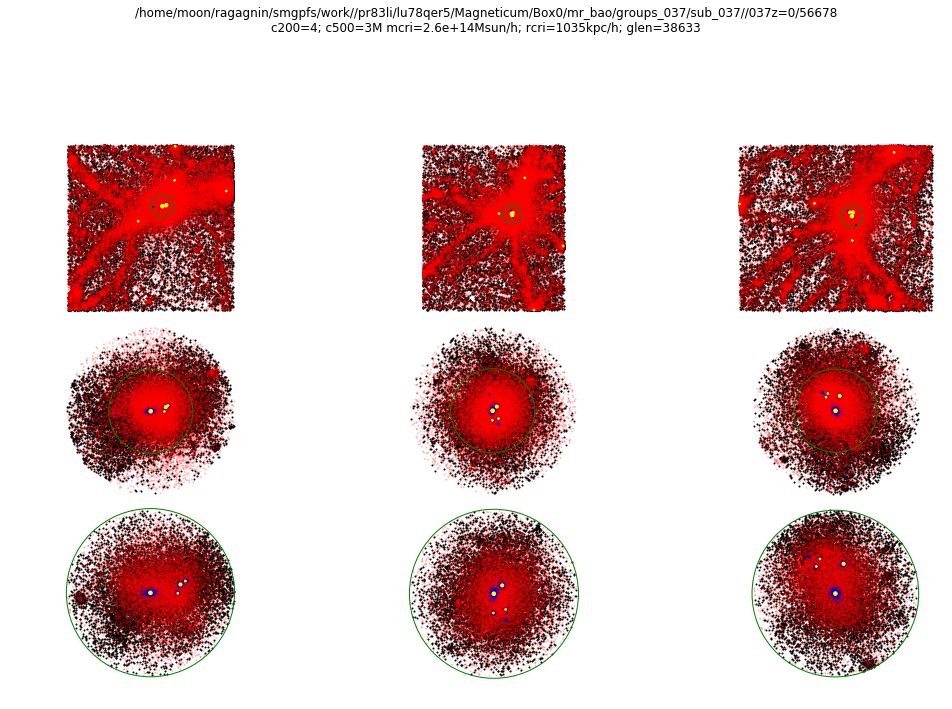

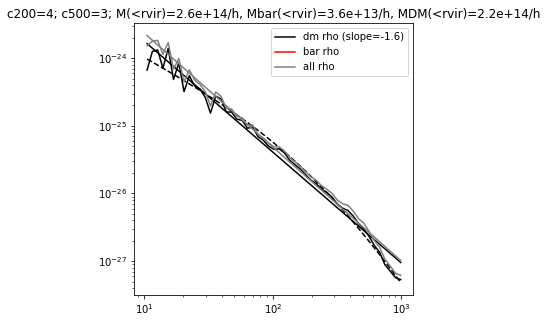

/HydroSims/Magneticum/Box0/mr_bao/ None None


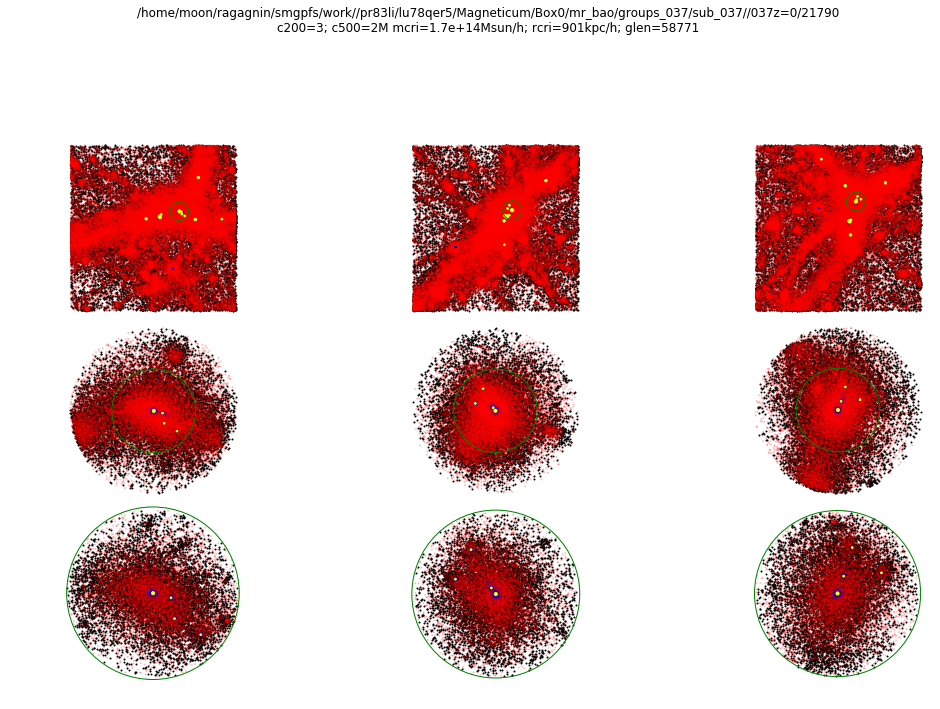

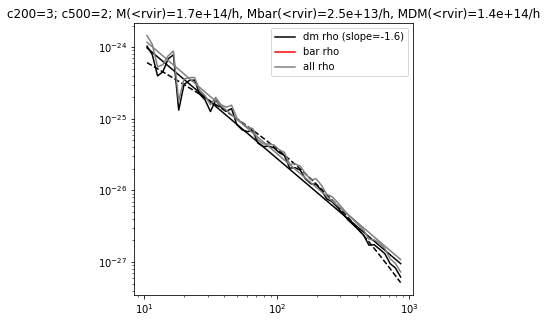

/HydroSims/Magneticum/Box4/uhr_test/ None None


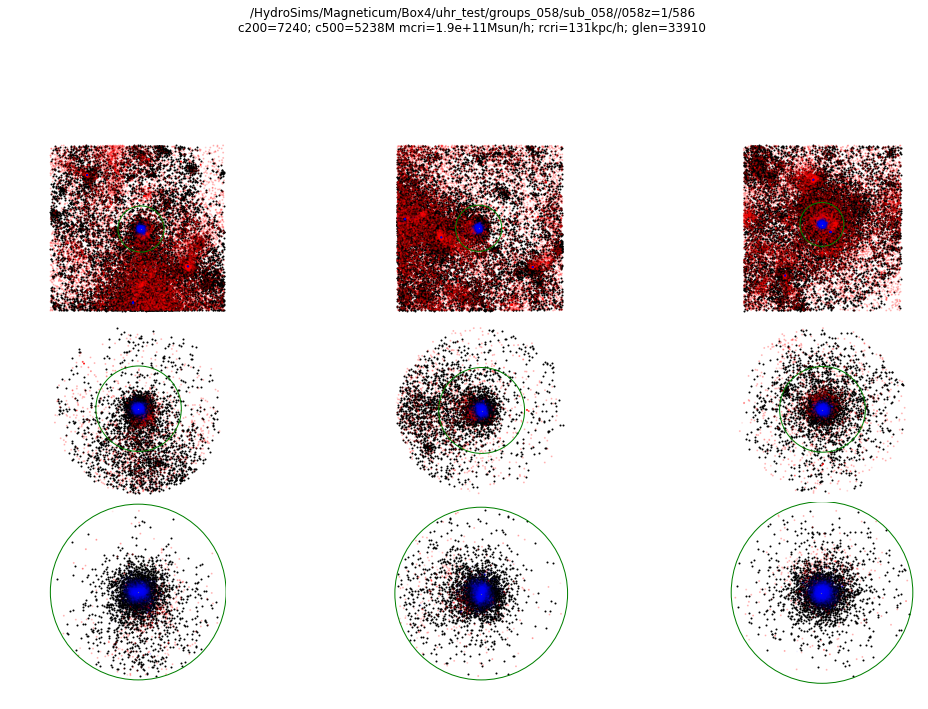

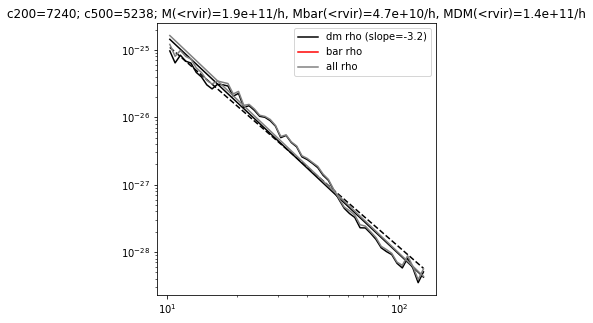

/HydroSims/Magneticum/Box4/uhr_test/ None None


/home/moon/ragagnin/g3t/pp.py:143: RuntimeWarning: invalid value encountered in less
  mask_distance = dists2<(cut*cut)


-1 MASS (26862,)
-1 POS  (26862, 3)
-1 VEL  (26862, 3)
-1 PTYPE (97260,)


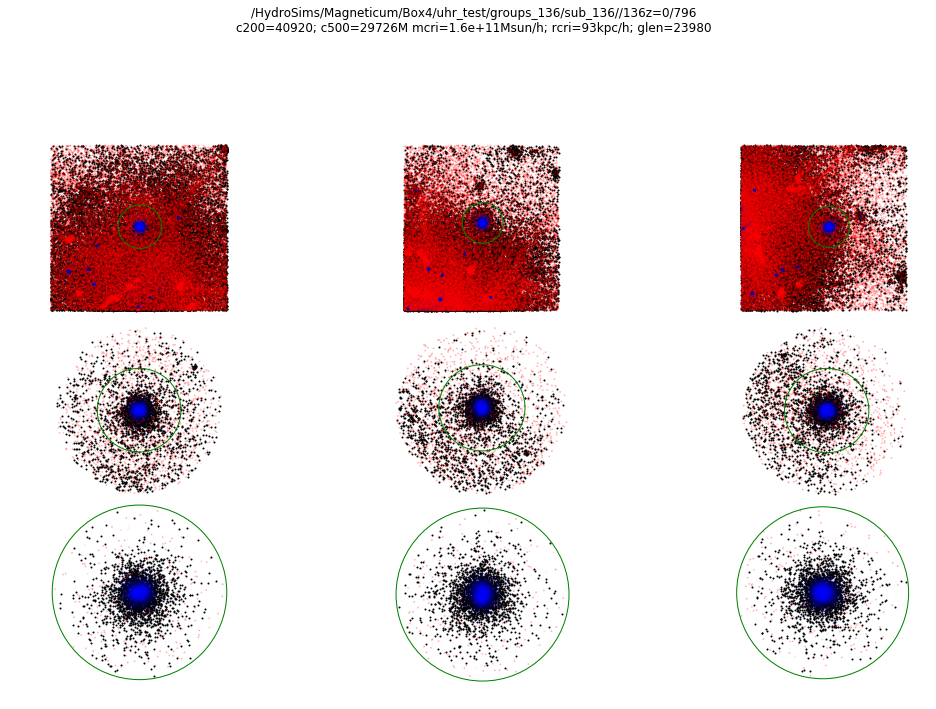

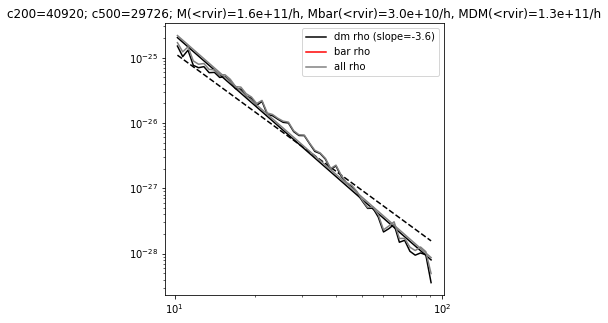

/HydroSims/Magneticum/Box4/uhr_test/ None None
-1 MASS (24401,)
-1 POS  (24401, 3)
-1 VEL  (24401, 3)
-1 PTYPE (36324,)


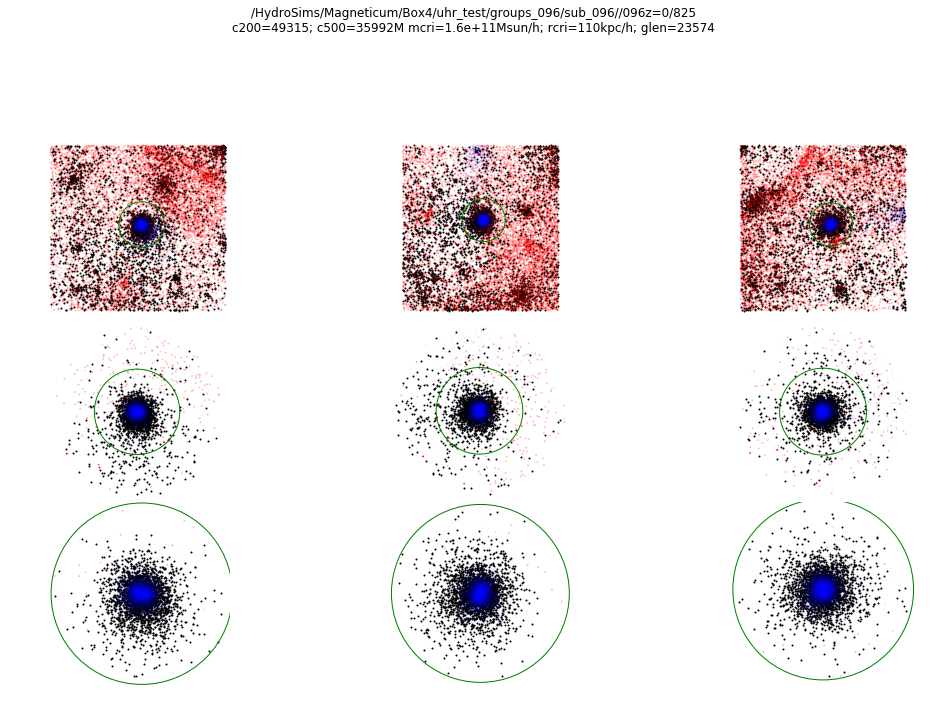

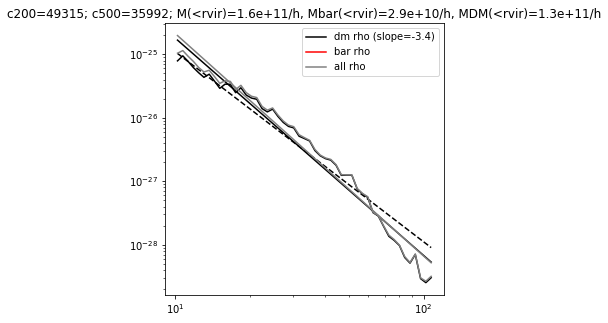

/HydroSims/Magneticum/Box4/uhr_test/ None None


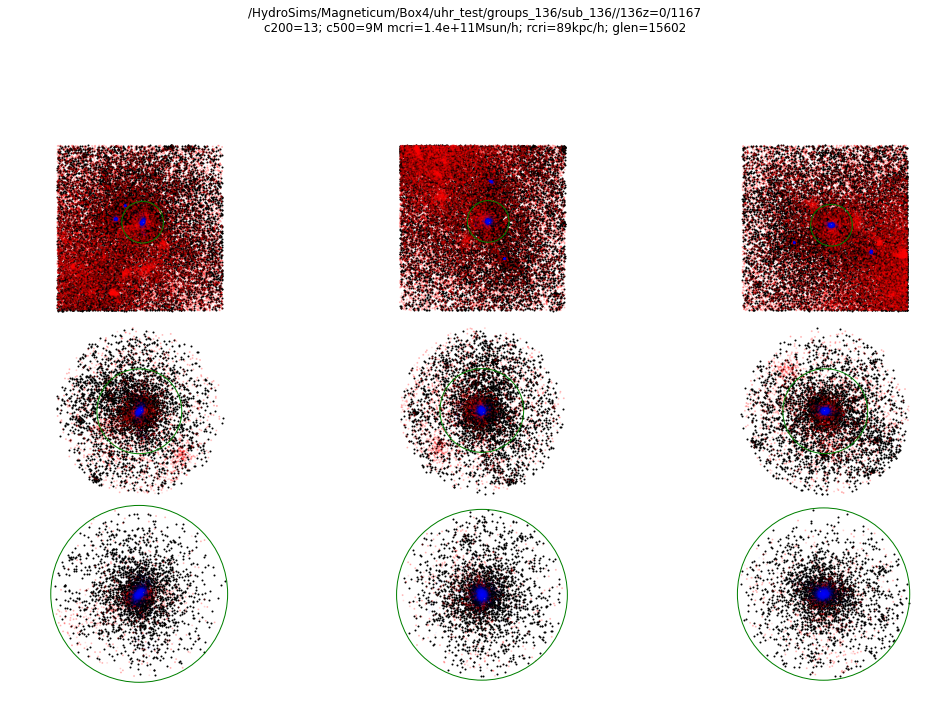

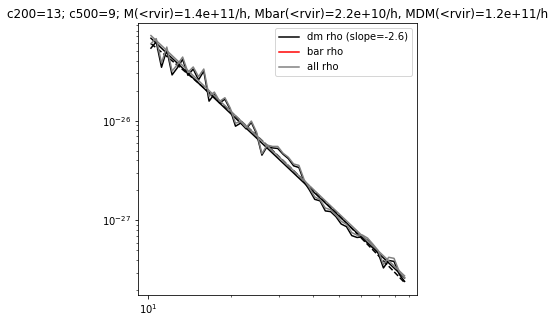

In [61]:
sub_base = None
candidates = [x for x in highconzrange.iterrows()] 
for candidate in candidates:
    idx, pp_cluster = candidate
    id_cluster = pp_cluster.id_cluster
    snap_id = pp_cluster.snap_id
    present( id_cluster, snap_id, bhfactor=10.)


In [ ]:
sub_base_box4

import matcha
import pp
import imp
imp.reload(matcha)
imp.reload(pp)
bucket_past = matcha.matcha(
                   sub_base_box4,
                   snap_base_box4,
                   None,
                   None,
                   '036',
                   '010',
                   folder='rese',
                   parallel=False,
                   also_dm=False,
                   id_cluster_end=412,
                   id_cluster_start=412)


In [ ]:
sub_base_box4

import matcha
import pp
import imp
imp.reload(matcha)
imp.reload(pp)
bucket_future = matcha.matcha(
                   sub_base_box4,
                   snap_base_box4,
                   None,
                   None,
                   '036',
                   '090',
                   folder='rese',
                   parallel=False,
                   also_dm=False,
                   id_cluster_end=412,
                   id_cluster_start=412)


/home/moon/ragagnin/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/moon/ragagnin/g3t/pp.py:143: RuntimeWarning: invalid value encountered in less
  mask_distance = dists2<(cut*cut)
/home/moon/ragagnin/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:132: RuntimeWarning: overflow encountered in multiply
/home/moon/ragagnin/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:140: RuntimeWarning: divide by zero encountered in log10
/home/moon/ragagnin/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:74: RuntimeWarning: divide by zero encountered in log10
/home/moon/ragagnin/anaconda3/lib/python3.6/site-packages/scipy/optimize/optimize.py

-1 MASS (1160,)
-1 POS  (1160, 3)
-1 VEL  (1160, 3)
-1 PTYPE (4869,)


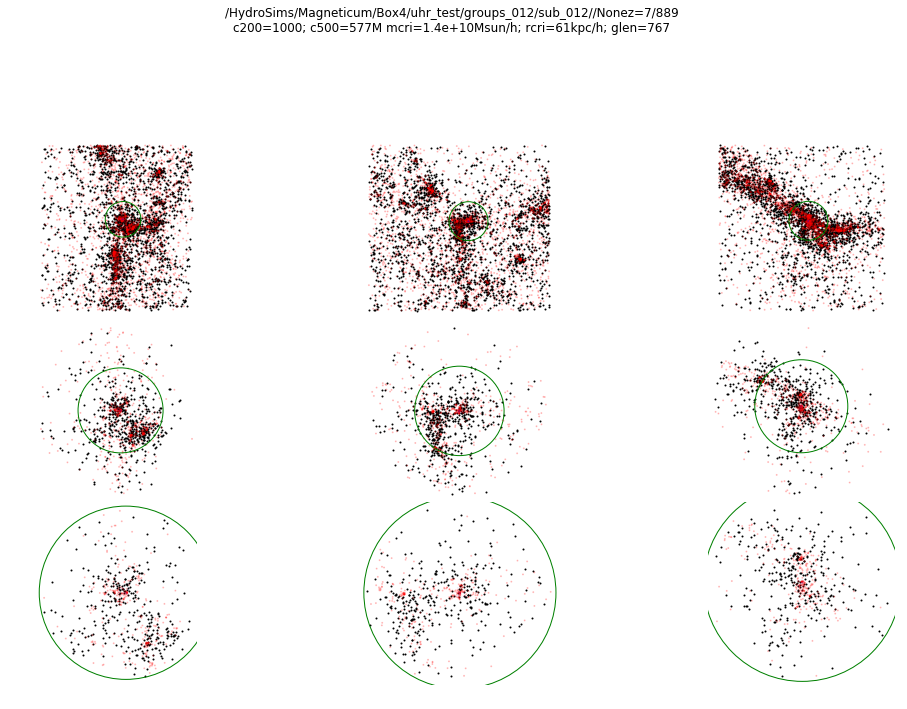

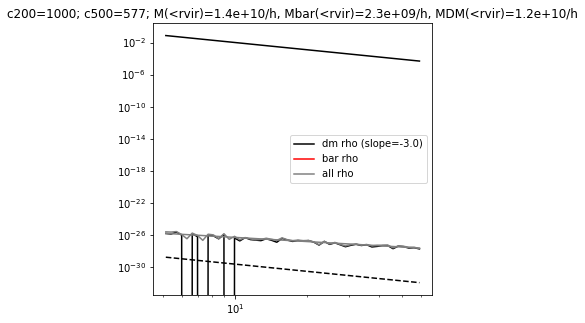

-1 MASS (3901,)
-1 POS  (3901, 3)
-1 VEL  (3901, 3)
-1 PTYPE (14699,)


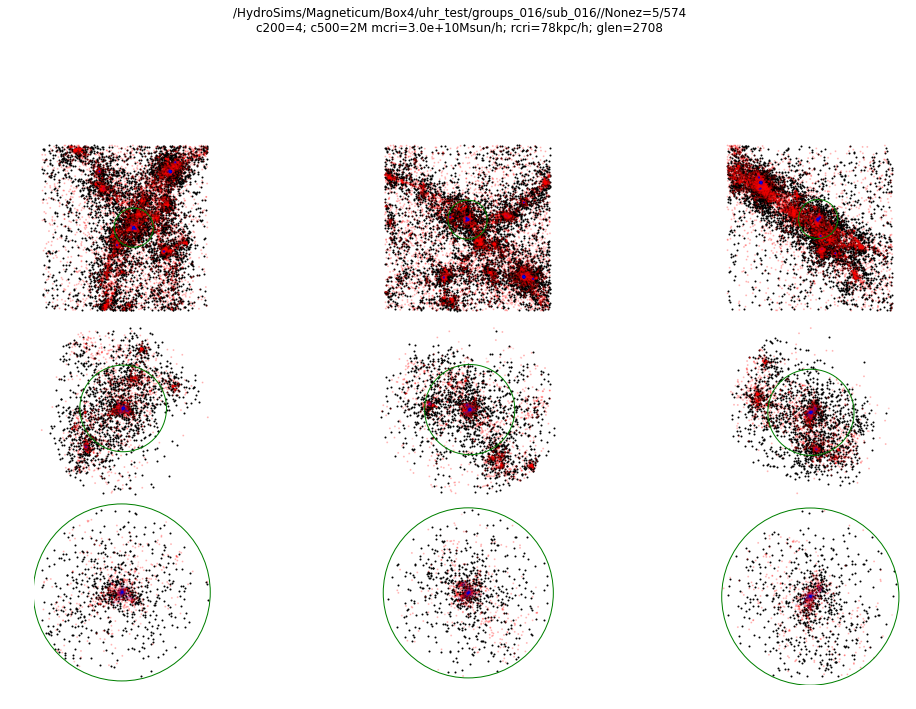

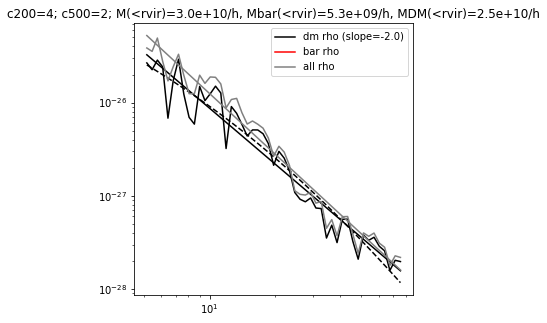

-1 MASS (18031,)
-1 POS  (18031, 3)
-1 VEL  (18031, 3)
-1 PTYPE (35001,)


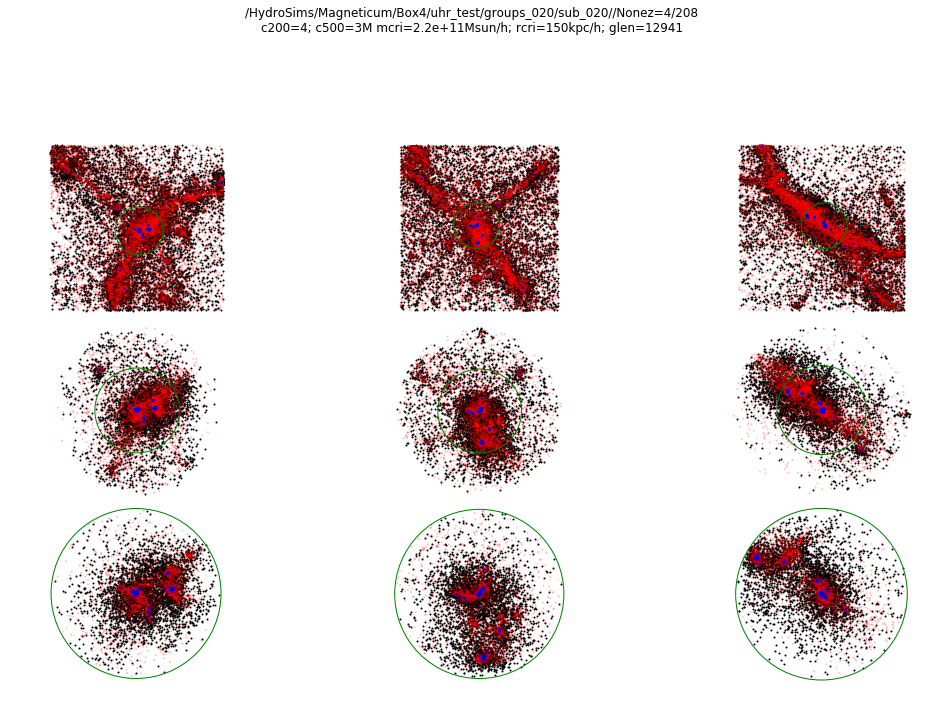

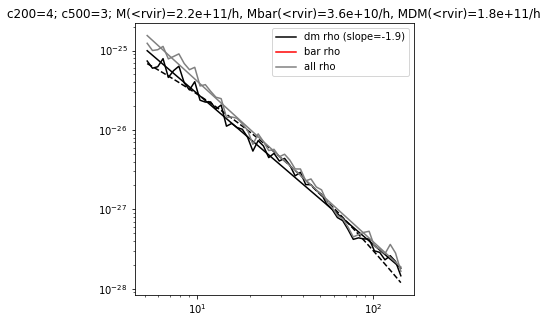

/home/moon/ragagnin/g3t/pp.py:166: RuntimeWarning: invalid value encountered in sqrt
  my_data[pt]['DIST']=np.sqrt(dists2[mask])


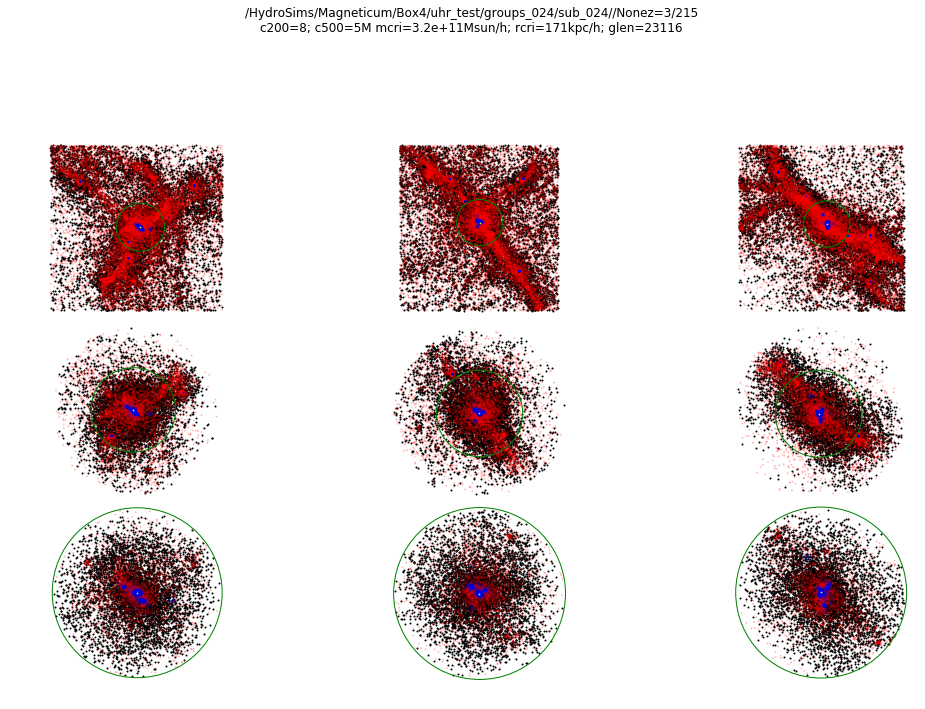

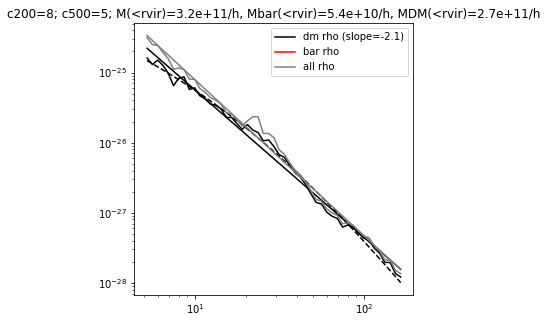

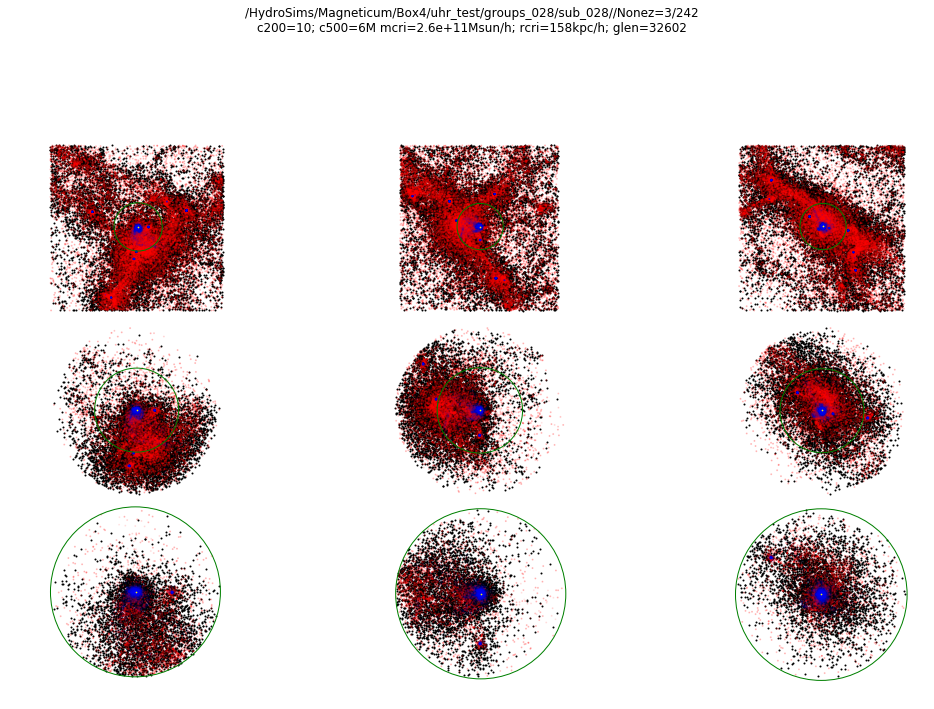

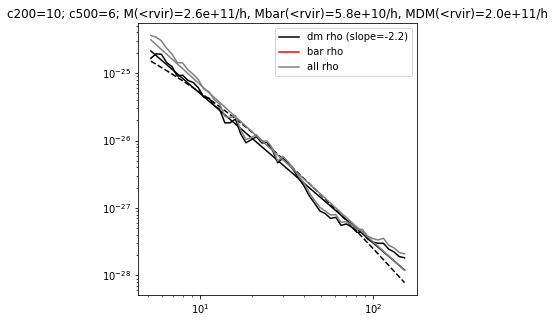

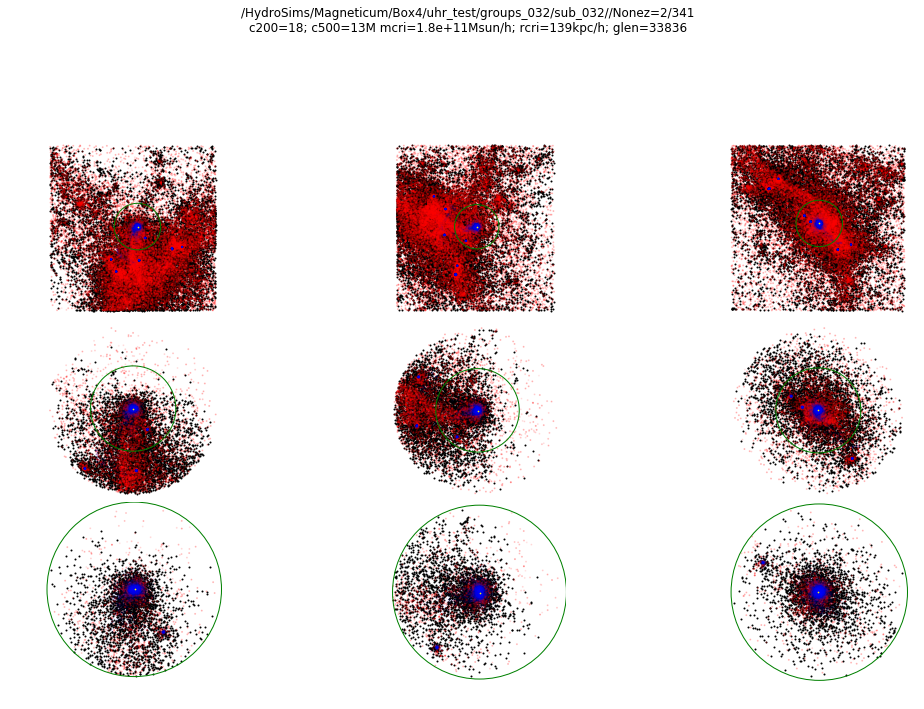

...

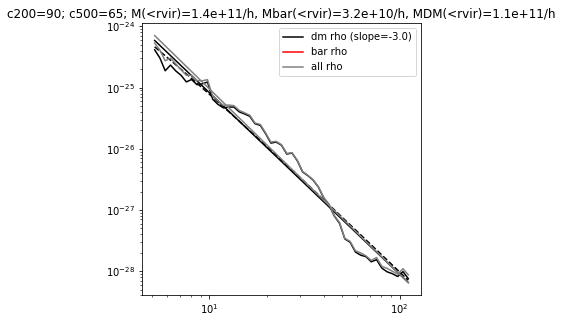

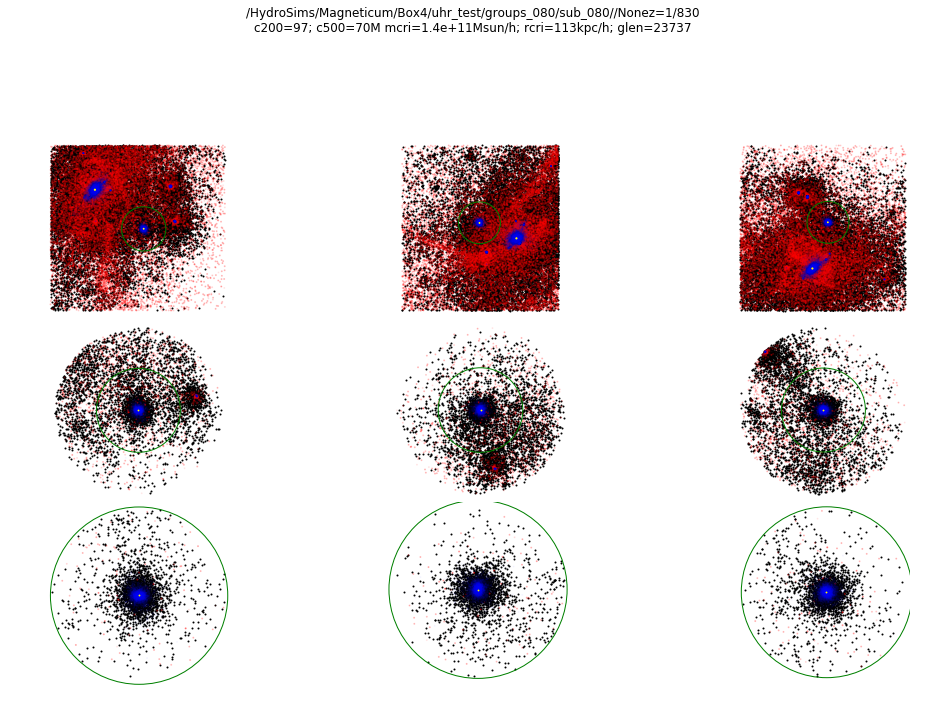

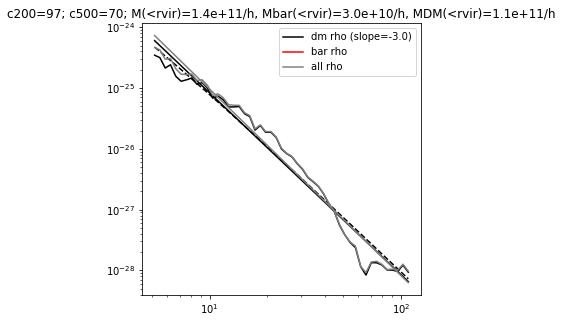

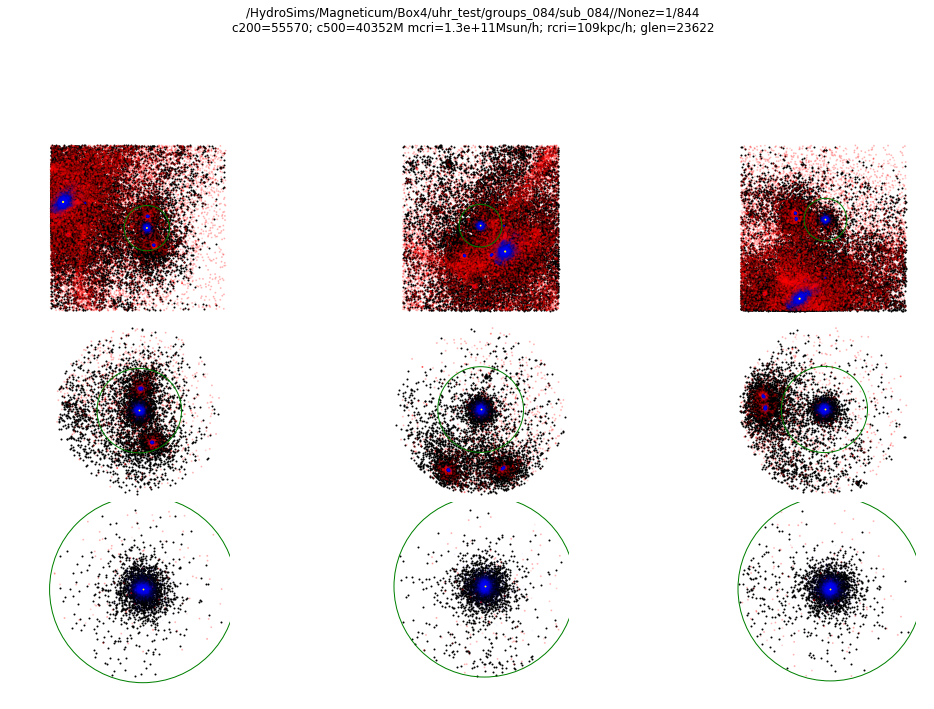

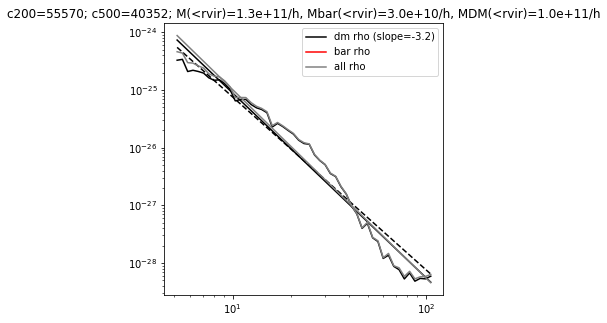

In [74]:
import os.path
for ele in  bucket_past[::-1]+bucket_future:
    #print(ele.__dict__)
    if not os.path.isfile(ele.snap_base+'.0') :
        continue
    present(ele.cluster_id, snap_base=ele.snap_base, group_base=ele.group_base, i_file=ele.cluster_i_file,i_cluster_in_file=ele.cluster_id_in_file, arrows=False)
   

In [ ]:
imp.reload(pp)
import types
imp.reload(matcha)
#for b in bucket_past[::-1]+bucket_future:
#    b.pictures_ptypes =  types.MethodType(pp.PostProcessing.pictures_ptypes, b)
matcha.display_bucket(bucket_past[::-1]+bucket_future, ptypes=True                 )

In [92]:
import pickle
piklami=[]
for b in bucket_past[::-1]+bucket_future :
    #del b.pictures_ptypes
    #piklami.append(b)
    d={k: b.__dict__[k] for k in ['cluster_id','cluster_id_in_file','cluster_i_file','group_base','snap_base', 'myinfo']}
    d['a'] = 1./(1.+b.z())
    piklami.append(d)
#
#piklami
pickle.dump(piklami , open( "save.p", "wb" ) )